# Noise Generator Demo

Visual demonstration of all available noise generators overlaid on a natural test image.
Each noise type is shown in its own section with parameter variations.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.data

In [3]:
from py_deffields.noise import (
    generate_gaussian,
    generate_perlin,
    generate_blobs,
    generate_poisson,
    generate_cellular,
    generate_spectral,
    generate_speckle,
    normalize_noise,
    add_noise,
)

## Settings

Configure the test image and volume parameters here.
Available grayscale images from `skimage.data`:
`camera`, `moon`, `coins`, `brick`, `grass`, `gravel`, `cell`, `clock`, `page`, `text`, `checkerboard`

In [4]:
# --- User settings ---
IMAGE_NAME = "camera"  # Change this to any skimage.data grayscale image
DEPTH = 64             # Number of slices along the z-axis
DISPLAY_SLICE = 32     # Which z-slice to display
SEED = 42              # Global random seed for reproducibility
# ---------------------

image_2d = getattr(skimage.data, IMAGE_NAME)()
if image_2d.ndim == 3:
    image_2d = np.mean(image_2d, axis=-1)
image_2d = image_2d.astype(np.float64)

# Normalize to [0, 1]
image_2d = (image_2d - image_2d.min()) / (image_2d.max() - image_2d.min())

# Replicate along z to create a volume
volume = np.stack([image_2d] * DEPTH, axis=0)
shape = volume.shape

print(f"Image: {IMAGE_NAME}")
print(f"Volume shape: {shape} (D, H, W)")
print(f"Display slice: z={DISPLAY_SLICE}")

Image: camera
Volume shape: (64, 512, 512) (D, H, W)
Display slice: z=32


In [5]:
def show_noise_comparison(
    noise_fields: dict[str, np.ndarray],
    volume: np.ndarray,
    z: int,
    weight: float = 0.3,
    suptitle: str = "",
) -> None:
    """Display noise-only and noise-overlaid panels for each variant."""
    n = len(noise_fields)
    fig, axes = plt.subplots(2, n, figsize=(4 * n, 7.5), squeeze=False)
    fig.suptitle(suptitle, fontsize=14, fontweight="bold", y=1.0)

    for col, (label, noise) in enumerate(noise_fields.items()):
        noise_slice = noise[z]
        vol_slice = volume[z]

        # Normalize noise to [0, 1] for display
        nmin, nmax = noise_slice.min(), noise_slice.max()
        if nmax - nmin > 1e-10:
            noise_disp = (noise_slice - nmin) / (nmax - nmin)
        else:
            noise_disp = np.zeros_like(noise_slice)

        # Top row: noise only
        axes[0, col].imshow(noise_disp, cmap="gray", vmin=0, vmax=1)
        axes[0, col].set_title(label, fontsize=10)
        axes[0, col].axis("off")

        # Bottom row: overlaid on volume
        blended = np.clip(vol_slice + weight * (noise_disp - 0.5), 0, 1)
        axes[1, col].imshow(blended, cmap="gray", vmin=0, vmax=1)
        axes[1, col].set_title(f"overlay (w={weight})", fontsize=9)
        axes[1, col].axis("off")

    axes[0, 0].set_ylabel("noise only", fontsize=10)
    axes[1, 0].set_ylabel("overlaid", fontsize=10)
    fig.tight_layout()
    plt.show()

---
## Gaussian Noise

Independent and identically distributed noise at each voxel.
Varying `std` controls the noise intensity.

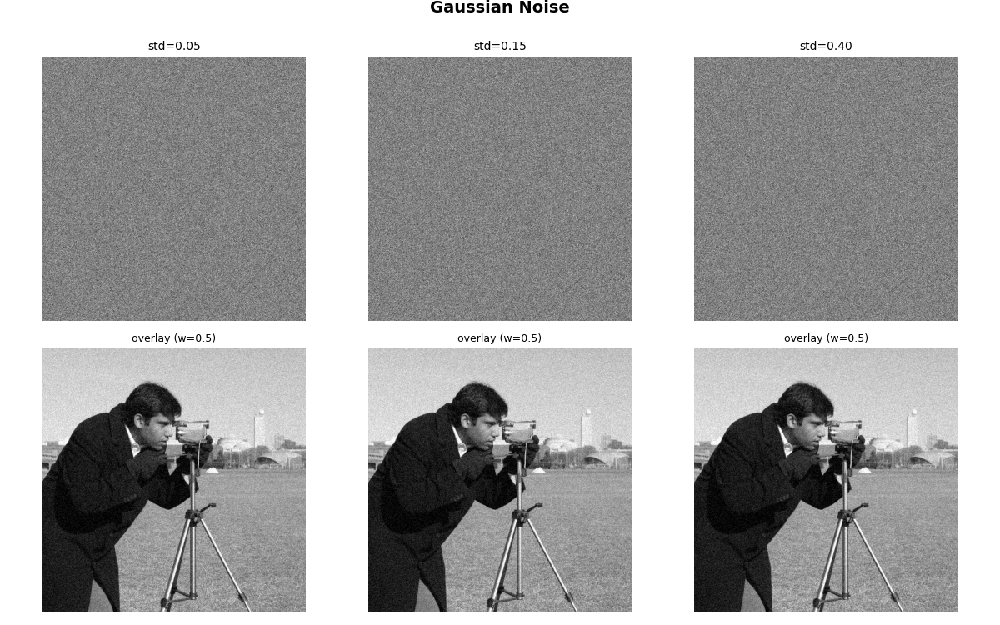

In [6]:
gaussian_variants = {
    "std=0.05": generate_gaussian(shape, std=0.05, rng=np.random.default_rng(SEED)),
    "std=0.15": generate_gaussian(shape, std=0.15, rng=np.random.default_rng(SEED)),
    "std=0.40": generate_gaussian(shape, std=0.40, rng=np.random.default_rng(SEED)),
}

show_noise_comparison(gaussian_variants, volume, DISPLAY_SLICE, weight=0.5, suptitle="Gaussian Noise")

---
## Perlin Noise

Coherent gradient noise with smooth, natural patterns.
Varying `octaves` adds finer detail via fractal Brownian motion (fBm).

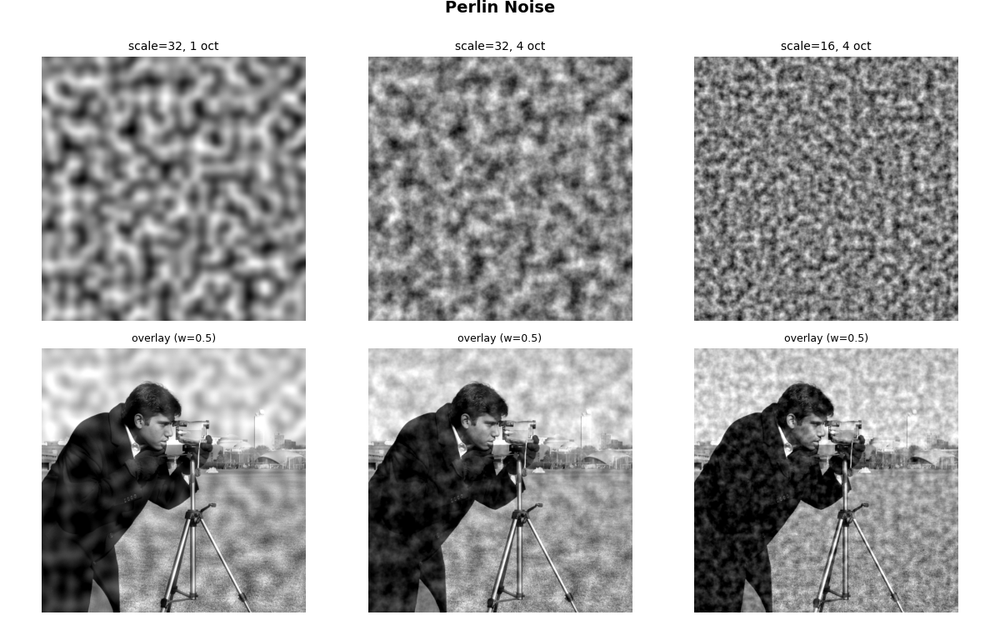

In [7]:
perlin_variants = {
    "scale=32, 1 oct": generate_perlin(shape, scale=32.0, octaves=1, rng=np.random.default_rng(SEED)),
    "scale=32, 4 oct": generate_perlin(shape, scale=32.0, octaves=4, rng=np.random.default_rng(SEED)),
    "scale=16, 4 oct": generate_perlin(shape, scale=16.0, octaves=4, rng=np.random.default_rng(SEED)),
}

show_noise_comparison(perlin_variants, volume, DISPLAY_SLICE, weight=0.5, suptitle="Perlin Noise")

---
## Blob Noise

Randomly placed spherical features simulating particles or fiducial markers.
Comparing soft (Gaussian falloff) vs hard edges, and varying blob count.

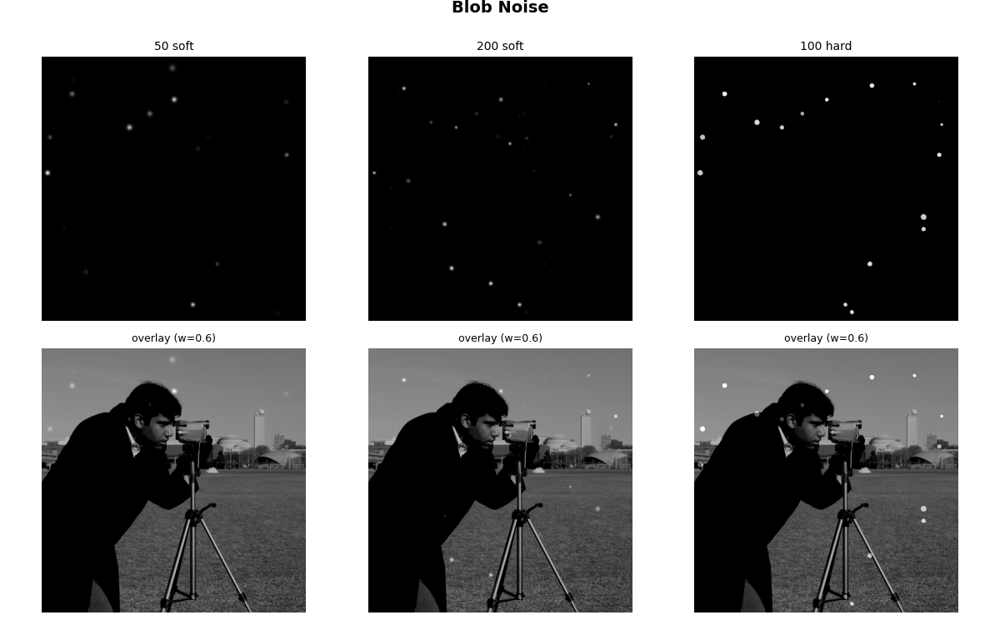

In [8]:
blob_variants = {
    "50 soft": generate_blobs(shape, num_blobs=50, radius_mean=6.0, soft=True, rng=np.random.default_rng(SEED)),
    "200 soft": generate_blobs(shape, num_blobs=200, radius_mean=4.0, soft=True, rng=np.random.default_rng(SEED)),
    "100 hard": generate_blobs(shape, num_blobs=100, radius_mean=5.0, soft=False, rng=np.random.default_rng(SEED)),
}

show_noise_comparison(blob_variants, volume, DISPLAY_SLICE, weight=0.6, suptitle="Blob Noise")

---
## Poisson (Shot) Noise

Signal-dependent noise modelling photon counting statistics.
Lower `scale` values produce heavier noise (fewer photons).

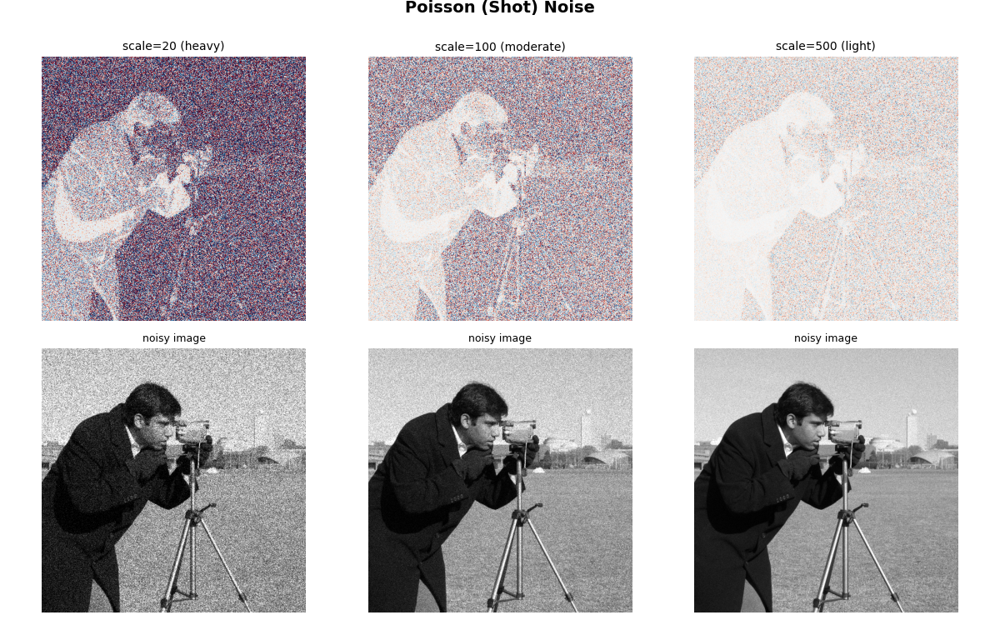

In [9]:
poisson_variants = {
    "scale=20 (heavy)": generate_poisson(shape, signal=volume, scale=20.0, normalize=False, rng=np.random.default_rng(SEED)),
    "scale=100 (moderate)": generate_poisson(shape, signal=volume, scale=100.0, normalize=False, rng=np.random.default_rng(SEED)),
    "scale=500 (light)": generate_poisson(shape, signal=volume, scale=500.0, normalize=False, rng=np.random.default_rng(SEED)),
}

# Poisson with normalize=False returns the full noisy signal, display directly
n = len(poisson_variants)
fig, axes = plt.subplots(2, n, figsize=(4 * n, 7.5), squeeze=False)
fig.suptitle("Poisson (Shot) Noise", fontsize=14, fontweight="bold", y=1.0)

for col, (label, noisy) in enumerate(poisson_variants.items()):
    noisy_slice = noisy[DISPLAY_SLICE]
    vol_slice = volume[DISPLAY_SLICE]

    # Top row: difference (noise component)
    diff = noisy_slice - vol_slice
    axes[0, col].imshow(diff, cmap="RdBu_r", vmin=-0.15, vmax=0.15)
    axes[0, col].set_title(label, fontsize=10)
    axes[0, col].axis("off")

    # Bottom row: full noisy signal
    axes[1, col].imshow(np.clip(noisy_slice, 0, 1), cmap="gray", vmin=0, vmax=1)
    axes[1, col].set_title("noisy image", fontsize=9)
    axes[1, col].axis("off")

axes[0, 0].set_ylabel("noise delta", fontsize=10)
axes[1, 0].set_ylabel("noisy image", fontsize=10)
fig.tight_layout()
plt.show()

---
## Cellular (Worley) Noise

Cell-like tessellation patterns based on distance to scattered feature points.
Comparing distance metrics and the F2-F1 combination (vein/crack pattern).

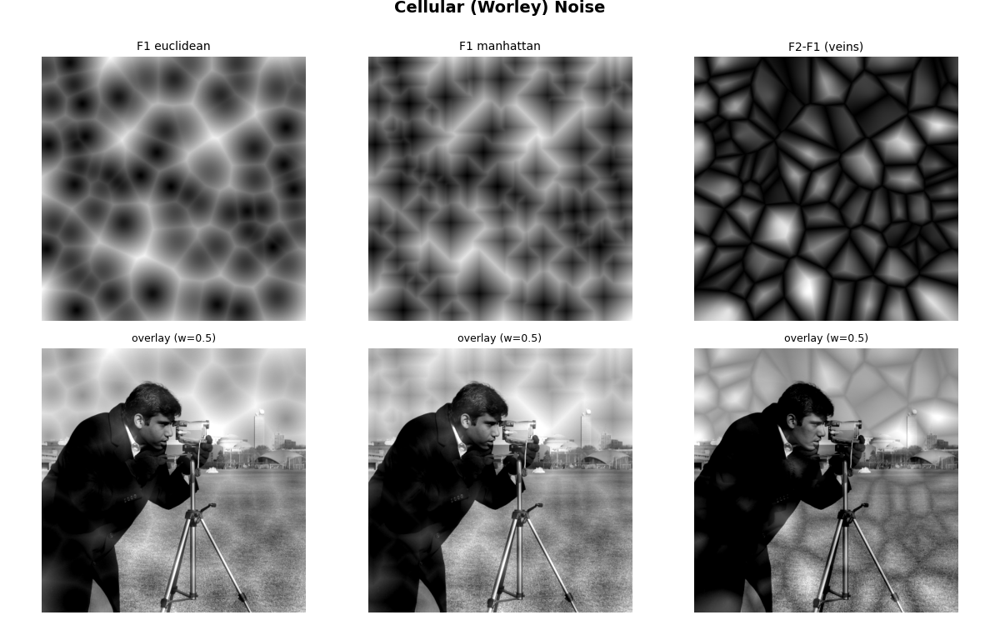

In [10]:
cellular_variants = {
    "F1 euclidean": generate_cellular(shape, num_points=80, metric="euclidean", combination="F1", rng=np.random.default_rng(SEED)),
    "F1 manhattan": generate_cellular(shape, num_points=80, metric="manhattan", combination="F1", rng=np.random.default_rng(SEED)),
    "F2-F1 (veins)": generate_cellular(shape, num_points=80, metric="euclidean", combination="F2-F1", rng=np.random.default_rng(SEED)),
}

show_noise_comparison(cellular_variants, volume, DISPLAY_SLICE, weight=0.5, suptitle="Cellular (Worley) Noise")

---
## Spectral (Frequency-Domain) Noise

Noise with prescribed power spectral density.
The spectral exponent controls the noise color: white (0), pink (1), brown (2).

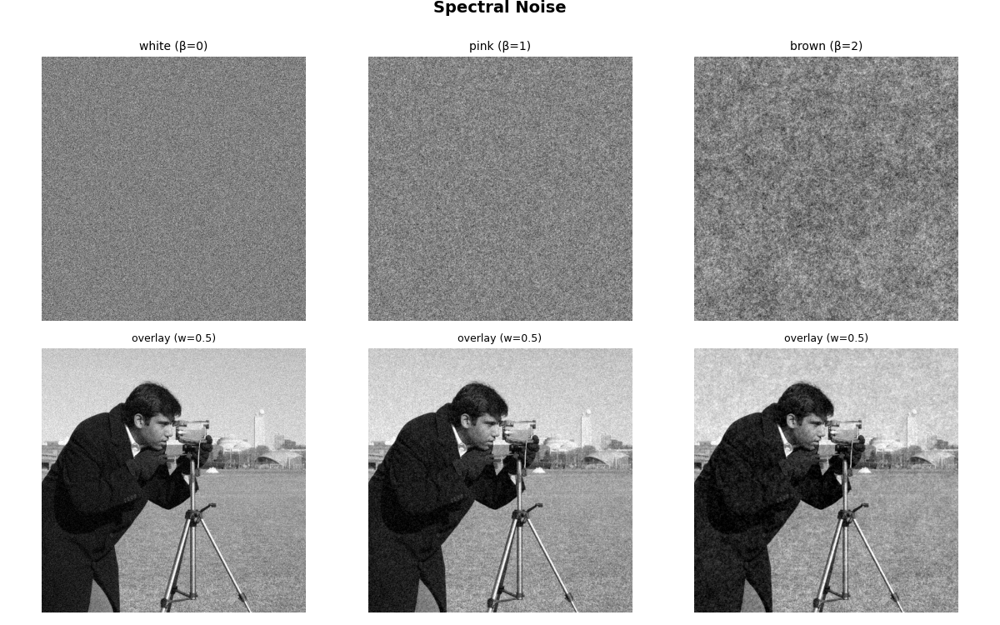

In [11]:
spectral_variants = {
    "white (\u03b2=0)": generate_spectral(shape, spectral_exponent=0.0, rng=np.random.default_rng(SEED)),
    "pink (\u03b2=1)": generate_spectral(shape, spectral_exponent=1.0, rng=np.random.default_rng(SEED)),
    "brown (\u03b2=2)": generate_spectral(shape, spectral_exponent=2.0, rng=np.random.default_rng(SEED)),
}

show_noise_comparison(spectral_variants, volume, DISPLAY_SLICE, weight=0.5, suptitle="Spectral Noise")

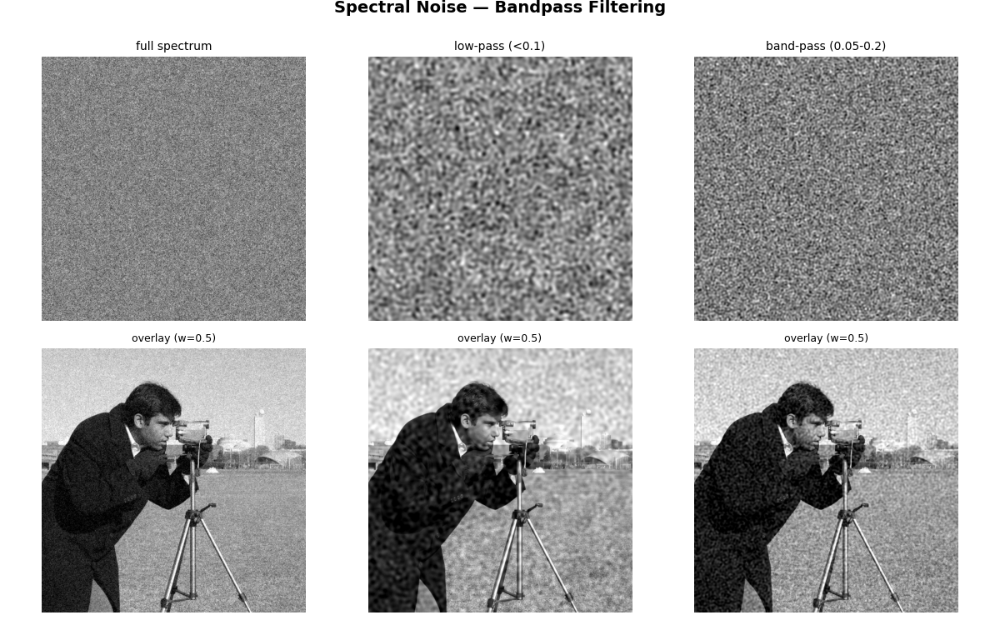

In [12]:
spectral_bandpass_variants = {
    "full spectrum": generate_spectral(shape, spectral_exponent=1.0, rng=np.random.default_rng(SEED)),
    "low-pass (<0.1)": generate_spectral(shape, spectral_exponent=1.0, freq_max=0.1, rng=np.random.default_rng(SEED)),
    "band-pass (0.05-0.2)": generate_spectral(shape, spectral_exponent=1.0, freq_min=0.05, freq_max=0.2, rng=np.random.default_rng(SEED)),
}

show_noise_comparison(spectral_bandpass_variants, volume, DISPLAY_SLICE, weight=0.5, suptitle="Spectral Noise \u2014 Bandpass Filtering")

---
## Speckle Noise

Multiplicative noise from coherent imaging systems (ultrasound, SAR, OCT).
The number of looks `L` controls speckle contrast: C = 1/sqrt(L).
Unlike additive noise, speckle is applied as I_observed = I_clean * S.

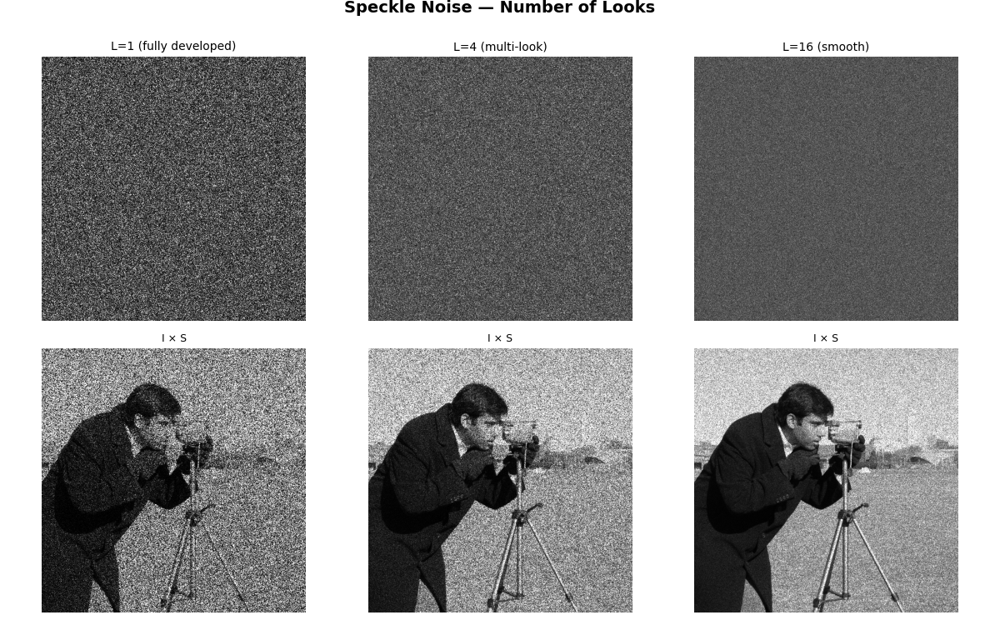

In [7]:
speckle_variants = {
    "L=1 (fully developed)": generate_speckle(shape, num_looks=1.0, rng=np.random.default_rng(SEED)),
    "L=4 (multi-look)": generate_speckle(shape, num_looks=4.0, rng=np.random.default_rng(SEED)),
    "L=16 (smooth)": generate_speckle(shape, num_looks=16.0, rng=np.random.default_rng(SEED)),
}

# Speckle is multiplicative: I_observed = I_clean * S
n = len(speckle_variants)
fig, axes = plt.subplots(2, n, figsize=(4 * n, 7.5), squeeze=False)
fig.suptitle("Speckle Noise — Number of Looks", fontsize=14, fontweight="bold", y=1.0)

for col, (label, speckle) in enumerate(speckle_variants.items()):
    speckle_slice = speckle[DISPLAY_SLICE]
    vol_slice = volume[DISPLAY_SLICE]

    # Top row: speckle field itself
    axes[0, col].imshow(speckle_slice, cmap="gray", vmin=0, vmax=3)
    axes[0, col].set_title(label, fontsize=10)
    axes[0, col].axis("off")

    # Bottom row: multiplicative application
    noisy = np.clip(vol_slice * speckle_slice, 0, 1)
    axes[1, col].imshow(noisy, cmap="gray", vmin=0, vmax=1)
    axes[1, col].set_title("I × S", fontsize=9)
    axes[1, col].axis("off")

axes[0, 0].set_ylabel("speckle field S", fontsize=10)
axes[1, 0].set_ylabel("noisy image", fontsize=10)
fig.tight_layout()
plt.show()

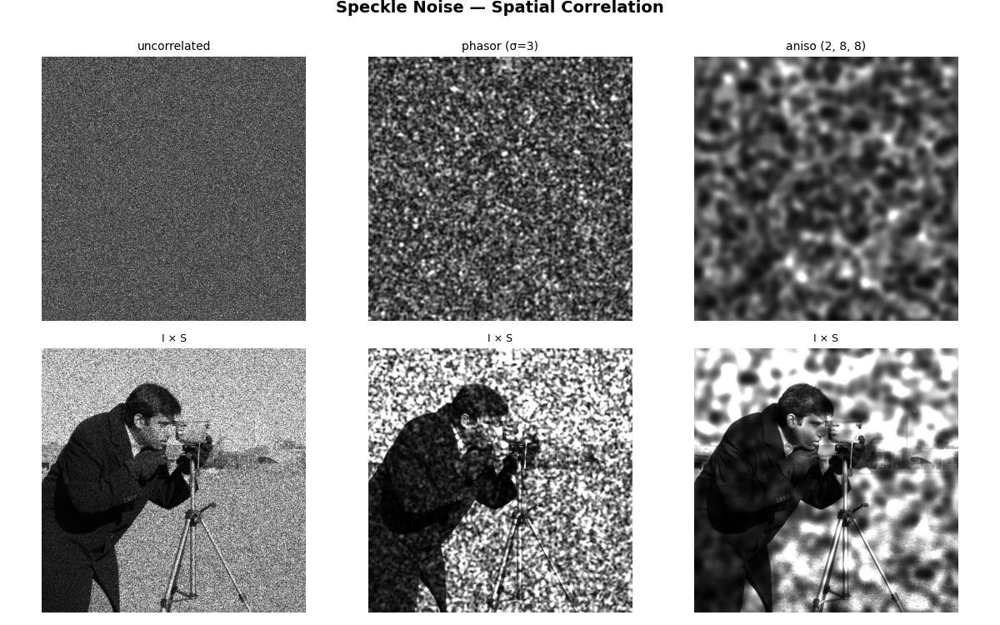

In [8]:
speckle_corr_variants = {
    "uncorrelated": generate_speckle(shape, num_looks=4.0, method="direct", rng=np.random.default_rng(SEED)),
    "phasor (σ=3)": generate_speckle(shape, num_looks=4.0, correlation_length=3.0, method="phasor", rng=np.random.default_rng(SEED)),
    "aniso (2, 8, 8)": generate_speckle(shape, num_looks=4.0, correlation_length=(2.0, 8.0, 8.0), method="filtered", rng=np.random.default_rng(SEED)),
}

n = len(speckle_corr_variants)
fig, axes = plt.subplots(2, n, figsize=(4 * n, 7.5), squeeze=False)
fig.suptitle("Speckle Noise — Spatial Correlation", fontsize=14, fontweight="bold", y=1.0)

for col, (label, speckle) in enumerate(speckle_corr_variants.items()):
    speckle_slice = speckle[DISPLAY_SLICE]
    vol_slice = volume[DISPLAY_SLICE]

    # Top row: speckle field
    axes[0, col].imshow(speckle_slice, cmap="gray", vmin=0, vmax=3)
    axes[0, col].set_title(label, fontsize=10)
    axes[0, col].axis("off")

    # Bottom row: multiplicative application
    noisy = np.clip(vol_slice * speckle_slice, 0, 1)
    axes[1, col].imshow(noisy, cmap="gray", vmin=0, vmax=1)
    axes[1, col].set_title("I × S", fontsize=9)
    axes[1, col].axis("off")

axes[0, 0].set_ylabel("speckle field S", fontsize=10)
axes[1, 0].set_ylabel("noisy image", fontsize=10)
fig.tight_layout()
plt.show()

---
## Combined Noise

Blending multiple noise types using the composition utilities.

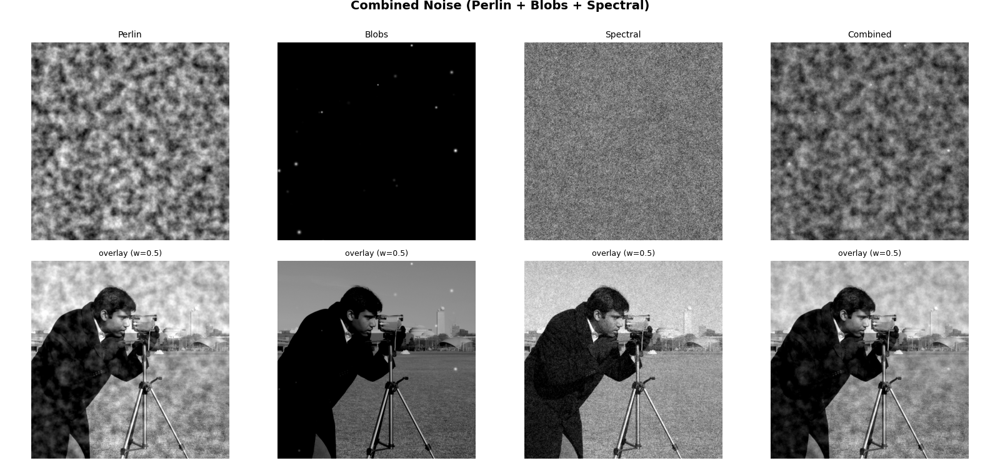

In [13]:
from py_deffields.noise import blend_noise

rng = np.random.default_rng(SEED)
perlin = generate_perlin(shape, scale=24.0, octaves=4, rng=rng)
blobs = generate_blobs(shape, num_blobs=120, radius_mean=4.0, soft=True, rng=rng)
spectral = generate_spectral(shape, spectral_exponent=1.5, rng=rng)

combined = blend_noise(
    normalize_noise(perlin, 0.0, 1.0),
    normalize_noise(blobs, 0.0, 1.0),
    normalize_noise(spectral, 0.0, 1.0),
    weights=[0.5, 0.3, 0.2],
)

combined_variants = {
    "Perlin": perlin,
    "Blobs": blobs,
    "Spectral": spectral,
    "Combined": combined,
}

show_noise_comparison(combined_variants, volume, DISPLAY_SLICE, weight=0.5, suptitle="Combined Noise (Perlin + Blobs + Spectral)")